<a href="https://colab.research.google.com/github/SondiSohan/Summer-Heat-Waves-Mobile-Alert-System/blob/main/SHWMD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   Present_Tmax  Present_Tmin  LDAPS_RHmin  LDAPS_RHmax  LDAPS_Tmax_lapse  \
0          30.3          21.1    61.741207    87.262192         26.629430   
1          29.3          20.9    85.943954    97.694801         25.380395   
2          29.5          22.2    32.008099    69.966370         31.991670   
3          32.6          21.2    60.070614    91.244827         27.043616   
4          33.0          27.6    62.508846    86.983963         31.529577   

   LDAPS_Tmin_lapse   LDAPS_WS   LDAPS_LH  LDAPS_CC1  LDAPS_CC2  ...  \
0         23.075077   4.263528  21.399026   0.297776   0.616711  ...   
1         23.275475   8.697955  53.165713   0.901123   0.867350  ...   
2         21.475995  10.461500  37.582673   0.012838   0.086090  ...   
3         23.338373  15.686361  95.842065   0.622580   0.388476  ...   
4         27.307177   6.493082  49.887497   0.438076   0.458994  ...   

   LDAPS_PPT1  LDAPS_PPT2  LDAPS_PPT3  LDAPS_PPT4      lat      lon       DEM  \
0    0.000000    0.0000

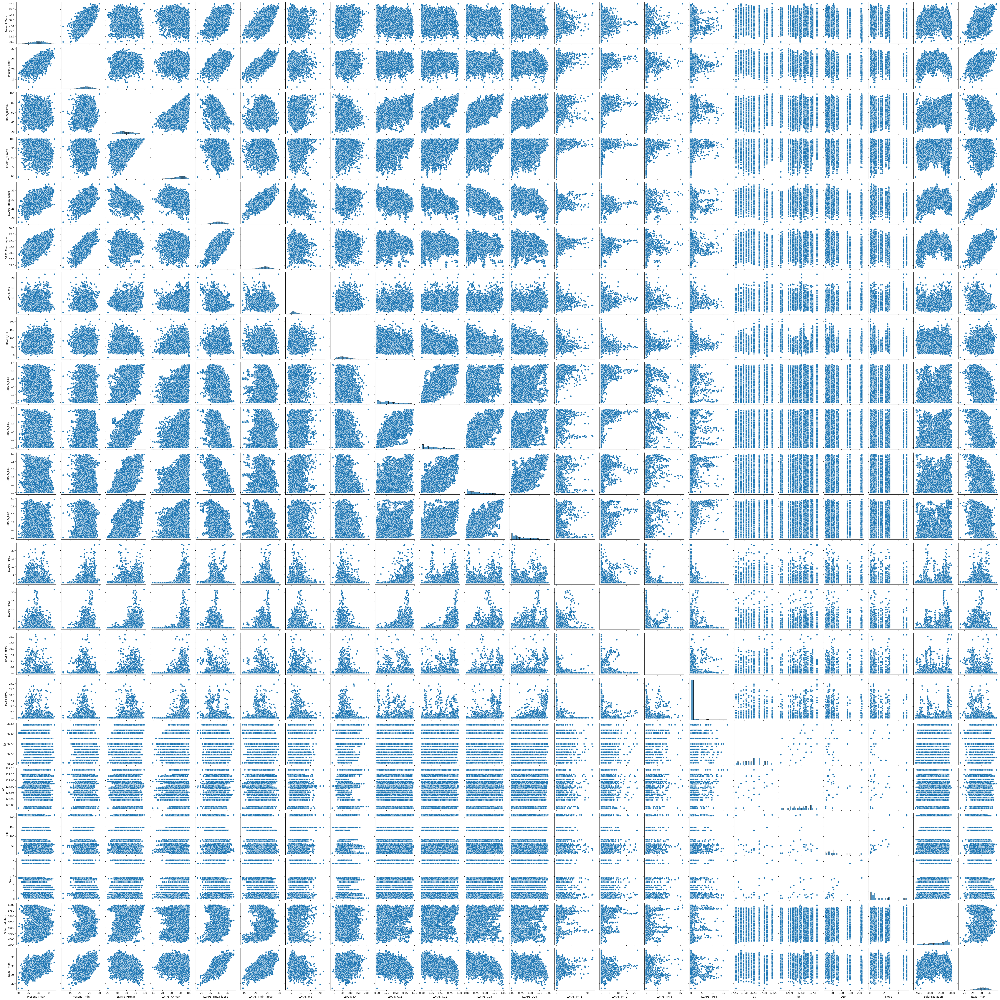

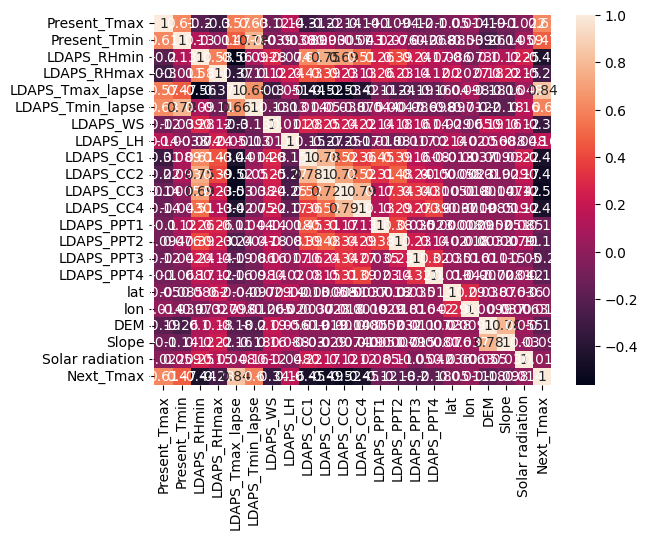

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4197
[LightGBM] [Info] Number of data points in the train set: 5160, number of used features: 21
[LightGBM] [Info] Start training from score 30.257694
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4194
[LightGBM] [Info] Number of data points in the train set: 5160, number of used features: 21
[LightGBM] [Info] Start training from score 30.218953
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enoug

In [3]:
# Importing necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error

# Reading and exploring the training data
train_data = pd.read_csv('/content/train_dataset.csv')
print(train_data.head())

print(train_data.describe())

print(train_data.isna().sum())

train_data_cleaned = train_data.dropna()
print(train_data_cleaned.describe())

# Visualizing data relationships
sns.pairplot(train_data_cleaned)
plt.show()

sns.heatmap(train_data_cleaned.corr(), annot=True)
plt.show()

# Preparing data for machine learning
X_train = train_data_cleaned.drop(columns='Next_Tmax')
y_train = train_data_cleaned['Next_Tmax']

X_train_scaled = MinMaxScaler().fit_transform(X_train)

# Comparing different models
models = {
    'RandomForestRegressor': RandomForestRegressor(),
    'GradientBoostingRegressor': GradientBoostingRegressor(),
    'LinearRegression': LinearRegression(),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'SVR': SVR(),
    'XGBRegressor': XGBRegressor(),
    'CatBoostRegressor': CatBoostRegressor(verbose=0),
    'LGBMRegressor': LGBMRegressor()
}

results = {}

for name, model in models.items():
    cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='neg_mean_squared_error')
    results[name] = np.mean(np.sqrt(-cv_scores))

print("Model Performance (Lower RMSE is better):")
for name, score in results.items():
    print(f"{name}: {score}")

# Selecting the best model (CatBoostRegressor) for final predictions
best_model = CatBoostRegressor(verbose=0)
best_model.fit(X_train_scaled, y_train)

# Reading and preparing the test dataset
test_data = pd.read_csv('/content/test_dataset.csv')
print(test_data.head())

print(test_data.describe())

# Ensure test data matches the format of training data
test_data_scaled = MinMaxScaler().fit_transform(test_data)

# Making predictions on the test dataset
test_predictions = best_model.predict(test_data_scaled)

# Assuming a threshold of 40°C for heat wave warning
heat_wave_threshold = 40

test_warnings = test_predictions > heat_wave_threshold
warning_areas = test_data[test_warnings]

print(f"Number of areas with predicted heat wave: {np.sum(test_warnings)}")

# Optionally, you can print out the specific areas
print("Areas with predicted heat wave:")
print(warning_areas)

# To add a message indicating a heat wave warning
if np.sum(test_warnings) > 0:
    print("Warning: Heat wave predicted in the following areas:")
    print(warning_areas)
else:
    print("No heat wave predicted.")
